In [1]:
# YOLOv11 License Plate Detection Training

# This notebook trains YOLOv11 small model to detect license plates from full vehicle images.

# **Dataset**: data/8000/8000.csv with plate bounding box annotations

# **Steps**:
# 1. Install dependencies
# 2. Convert CSV data to YOLO format
# 3. Setup dataset configuration
# 4. Train YOLOv11 small
# 5. Evaluate and test the model

In [2]:
# Install required packages
# !pip install ultralytics opencv-python pillow pandas matplotlib

In [3]:
import os
import pandas as pd
import numpy as np
from pathlib import Path
import shutil
from PIL import Image
import ast
import cv2
from sklearn.model_selection import train_test_split

# Setup paths
PROJECT_ROOT = Path(r"C:\Users\Tanaphat\Desktop\Coding\ALPR")
DATA_DIR = PROJECT_ROOT / "data" / "8000"
CSV_PATH = DATA_DIR / "8000.csv"
OUTPUT_DIR = PROJECT_ROOT / "train_lastest" / "yolo_dataset"

print(f"Project root: {PROJECT_ROOT}")
print(f"Data directory: {DATA_DIR}")
print(f"CSV path: {CSV_PATH}")
print(f"Output directory: {OUTPUT_DIR}")

Project root: C:\Users\Tanaphat\Desktop\Coding\ALPR
Data directory: C:\Users\Tanaphat\Desktop\Coding\ALPR\data\8000
CSV path: C:\Users\Tanaphat\Desktop\Coding\ALPR\data\8000\8000.csv
Output directory: C:\Users\Tanaphat\Desktop\Coding\ALPR\train_lastest\yolo_dataset


## Step 1: Load and Explore Data


In [4]:
# Load CSV
df = pd.read_csv(CSV_PATH)
print(f"Total samples: {len(df)}")
print(f"\nColumns: {df.columns.tolist()}")
print(f"\nFirst few rows:")
df.head()

Total samples: 8172

Columns: ['Unnamed: 0', 'transactionDate', 'cameras_plateNo1', 'province_code', 'province_description', 'brand_description', 'colors_code', 'colors_description', 'vehicleClass', 'image_name', 'image_name_gray', 'car_bbox', 'plate_bbox', 'character_bbox', 'is_validate', 'plate']

First few rows:


,Unnamed: 0,transactionDate,cameras_plateNo1,province_code,province_description,brand_description,colors_code,colors_description,vehicleClass,image_name,image_name_gray,car_bbox,plate_bbox,character_bbox,is_validate,plate
0,0,2024-07-05 14:00:23.865,กง8989,TH-70,ราชบุรี,HONDA,VCOLOR0009,เทา,1.0,/210/2024-07-05/14/Lane1/2024-07-05_14-00-23-9...,/210/2024-07-05/14/Lane1/2024-07-05_14-00-23-9...,"[[26, 5, 1013, 1264]]","[[331, 1149, 528, 1233]]","[[[22, 19], [180, 19], [180, 55], [22, 55]], [...",True,กง8989
1,1,2024-07-05 14:00:25.967,5กณ2033,TH-10,กรุงเทพมหานคร,TOYOTA,VCOLOR0007,ดำ,1.0,/210/2024-07-05/14/Lane1/2024-07-05_14-00-26-0...,/210/2024-07-05/14/Lane1/2024-07-05_14-00-26-0...,"[[0, 5, 944, 1466]]","[[148.61530303955078, 1370.0595092773438, 354....","[[[12, 21], [188, 21], [188, 60], [12, 60]], [...",True,5กณ2033
2,2,2024-07-05 14:00:32.549,2ฒห6707,TH-10,กรุงเทพมหานคร,TOYOTA,VCOLOR0008,ขาว,1.0,/210/2024-07-05/14/Lane1/2024-07-05_14-00-32-6...,/210/2024-07-05/14/Lane1/2024-07-05_14-00-32-6...,"[[10, 5, 1178, 1600]]","[[387.30584716796875, 1437.000732421875, 593.3...","[[[18, 24], [187, 24], [187, 64], [18, 64]], [...",True,2ฒห6707
3,3,2024-07-05 14:00:45.088,4ขฎ7688,TH-10,กรุงเทพมหานคร,ไม่พบข้อมูล,VCOLOR0009,เทา,1.0,/210/2024-07-05/14/Lane1/2024-07-05_14-00-45-1...,/210/2024-07-05/14/Lane1/2024-07-05_14-00-45-1...,"[[0, 0, 1024, 1205]]","[[309, 1038, 482, 1113]]","[[[7, 17], [161, 17], [161, 50], [7, 50]], [[2...",True,4ขฎ7688
4,4,2024-07-05 14:00:46.100,ขล2431,TH-20,ชลบุรี,MAZDA,VCOLOR0008,ขาว,1.0,/210/2024-07-05/14/Lane1/2024-07-05_14-00-46-2...,/210/2024-07-05/14/Lane1/2024-07-05_14-00-46-2...,"[[136.372314453125, 71.5794677734375, 1212.409...","[[362.73297119140625, 1357.184814453125, 592.2...","[[[37, 32], [197, 32], [197, 71], [37, 71]], [...",True,ขล2431


In [5]:
# Check for valid data
print(f"Samples with is_validate=True: {df['is_validate'].sum()}")
print(f"Samples with plate_bbox: {df['plate_bbox'].notna().sum()}")

# Filter valid samples
df_valid = df[df['is_validate'] == True].copy()
print(f"\nValid samples: {len(df_valid)}")

Samples with is_validate=True: 8172
Samples with plate_bbox: 8172

Valid samples: 8172


## Step 2: Parse Bounding Boxes and Prepare Data


In [6]:
def parse_bbox(bbox_str):
    """Parse bbox from string to coordinates"""
    try:
        bbox = ast.literal_eval(bbox_str)
        if isinstance(bbox, list) and len(bbox) > 0:
            # bbox is [[x1, y1, x2, y2]]
            return bbox[0]
        return None
    except:
        return None

def load_image_cv2(img_path):
    """
    Load image using cv2.imread() which handles Unicode paths better on Windows.
    Returns RGB numpy array.
    """
    # cv2.imread() ไม่ support Unicode paths โดยตรง ต้องใช้ np.fromfile()
    img_array = np.fromfile(str(img_path), dtype=np.uint8)
    img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)
    
    if img is None:
        raise FileNotFoundError(f"Cannot load image: {img_path}")
    
    # แปลง BGR (OpenCV) เป็น RGB (Matplotlib)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def convert_to_yolo_format(bbox, img_width, img_height):
    """
    Convert [x1, y1, x2, y2] to YOLO format [x_center, y_center, width, height] (normalized)
    """
    x1, y1, x2, y2 = bbox
    
    # Calculate center and dimensions
    x_center = (x1 + x2) / 2
    y_center = (y1 + y2) / 2
    width = x2 - x1
    height = y2 - y1
    
    # Normalize by image dimensions
    x_center_norm = x_center / img_width
    y_center_norm = y_center / img_height
    width_norm = width / img_width
    height_norm = height / img_height
    
    return [x_center_norm, y_center_norm, width_norm, height_norm]

# Parse bboxes
df_valid['car_bbox_parsed'] = df_valid['car_bbox'].apply(parse_bbox)
df_valid['plate_bbox_parsed'] = df_valid['plate_bbox'].apply(parse_bbox)

# Note: Will apply scale correction after getting image dimensions
df_valid['bbox_parsed'] = df_valid['plate_bbox_parsed']

# Filter out rows where bbox conversion failed
df_valid = df_valid[df_valid['bbox_parsed'].notna()].copy()
print(f"Samples with valid bboxes: {len(df_valid)}")

# Show example
print("\nExample bbox (before scale correction):")
sample = df_valid.iloc[0]
print(f"  Plate bbox: {sample['bbox_parsed']}")
print(f"  Image size: {sample.get('width', 'N/A')} x {sample.get('height', 'N/A')}")

Samples with valid bboxes: 8172

Example bbox (before scale correction):
  Plate bbox: [331, 1149, 528, 1233]
  Image size: N/A x N/A


## Step 3: Verify Images and Create Dataset Split


In [ ]:
# Verify images exist and get dimensions
def check_image(row):
    """Check if image exists and get its dimensions"""
    # Remove leading slash and construct full path
    img_path = DATA_DIR / row['image_name'].lstrip('/')
    
    if img_path.exists():
        try:
            # ใช้ cv2 แทน PIL เพื่อ handle Unicode paths
            img_array = load_image_cv2(img_path)
            height, width = img_array.shape[:2]
            return pd.Series({
                'exists': True,
                'width': width,
                'height': height,
                'full_path': str(img_path)
            })
        except:
            return pd.Series({'exists': False, 'width': None, 'height': None, 'full_path': None})
    return pd.Series({'exists': False, 'width': None, 'height': None, 'full_path': None})

# Apply check (this may take a while)
print("Checking images...")
image_info = df_valid.apply(check_image, axis=1)
df_valid = pd.concat([df_valid, image_info], axis=1)

# Filter to only existing images
df_valid = df_valid[df_valid['exists'] == True].copy()
print(f"Images found: {len(df_valid)}")

# NOW apply scale correction AND convert to full-image coordinates
def fix_bbox_scale(row):
    """
    Fix plate_bbox coordinates based on annotation tool bug.
    
    ANNOTATION TOOL WORKFLOW (from src/handlers.py and src/gui.py):
    1. car_bbox: User draws on FULL image → resized to 480px display
       - Line 106 in handlers.py: coords divided by ratio = MULTIPLIED by (1/ratio)
       - For 1920px: ratio = 480/1920 = 0.25 → saved coords are 4× too large
       - For 2560px: ratio = 480/2560 = 0.1875 → saved coords are 5.33× too large
    
    2. plate_bbox: User draws on CAR CROP → resized to 480px display  
       - Same bug: coords divided by ratio = MULTIPLIED by (1/ratio)
       - Saved plate_bbox is in CAR-RELATIVE coordinates
    
    CORRECTION STEPS:
    1. Calculate scale factor based on original image width
    2. Descale car_bbox to get correct full-image coords
    3. Descale plate_bbox to get correct car-relative coords
    4. Add corrected car offset to plate coords
    """
    plate_bbox = row['plate_bbox_parsed']
    car_bbox = row['car_bbox_parsed']
    
    if plate_bbox is None or car_bbox is None:
        return None
    
    img_width = row['width']
    img_height = row['height']
    
    # Calculate scale factor based on image width
    # Annotation tool resizes to max_width=480 (from utils.py)
    DISPLAY_WIDTH = 480
    ratio = DISPLAY_WIDTH / float(img_width)
    SCALE_FACTOR = 1.0 / ratio  # = img_width / 480
    
    # For 1920px images: SCALE_FACTOR = 1920/480 = 4.0
    # For 2560px images: SCALE_FACTOR = 2560/480 = 5.333...
    
    # Step 1: Fix car_bbox (full-image coordinates)
    car_x1, car_y1, car_x2, car_y2 = car_bbox
    car_x1 = car_x1 / SCALE_FACTOR
    car_y1 = car_y1 / SCALE_FACTOR
    car_x2 = car_x2 / SCALE_FACTOR
    car_y2 = car_y2 / SCALE_FACTOR
    
    # Step 2: Fix plate_bbox (car-relative coordinates)
    px1, py1, px2, py2 = plate_bbox
    px1 = px1 / SCALE_FACTOR
    py1 = py1 / SCALE_FACTOR
    px2 = px2 / SCALE_FACTOR
    py2 = py2 / SCALE_FACTOR
    
    # Step 3: Convert plate from car-relative to full-image coordinates
    px1 = px1 + car_x1
    py1 = py1 + car_y1
    px2 = px2 + car_x1
    py2 = py2 + car_y1
    
    # Step 4: Clamp to image bounds
    px1 = max(0, min(px1, img_width))
    py1 = max(0, min(py1, img_height))
    px2 = max(0, min(px2, img_width))
    py2 = max(0, min(py2, img_height))
    
    return [px1, py1, px2, py2]

df_valid['bbox_parsed'] = df_valid.apply(fix_bbox_scale, axis=1)

# Show example and scale factors
if len(df_valid) > 0:
    print(f"\nImage size distribution:")
    size_counts = df_valid.groupby(['width', 'height']).size()
    for (w, h), count in size_counts.items():
        scale_factor = w / 480
        print(f"  {w}x{h}: {count} images (scale factor = {scale_factor:.2f})")
    
    print(f"\nExample after scale correction:")
    sample = df_valid.iloc[0]
    sample_scale = sample['width'] / 480
    print(f"  Full path: {sample['full_path']}")
    print(f"  Image size: {sample['width']} x {sample['height']}")
    print(f"  Scale factor: {sample_scale:.3f}")
    print(f"  Original plate bbox: {sample['plate_bbox_parsed']}")
    print(f"  Corrected plate bbox: {sample['bbox_parsed']}")


Checking images...


In [ ]:
# Split dataset: 70% train, 20% val, 10% test
train_df, temp_df = train_test_split(df_valid, test_size=0.3, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.33, random_state=42)  # 0.33 of 0.3 = 0.1

print(f"Train samples: {len(train_df)}")
print(f"Validation samples: {len(val_df)}")
print(f"Test samples: {len(test_df)}")

Train samples: 5702
Validation samples: 1638
Test samples: 807


## Step 4: Create YOLO Dataset Structure


### Clean up old dataset (if exists) and recreate with correct coordinates


In [ ]:
# Clean up old dataset if it exists
import shutil

if OUTPUT_DIR.exists():
    print(f"Removing old dataset at {OUTPUT_DIR}")
    shutil.rmtree(OUTPUT_DIR)
    print("✓ Old dataset removed")
else:
    print("No existing dataset found")

# Create fresh YOLO directory structure
for split in ['train', 'val', 'test']:
    (OUTPUT_DIR / 'images' / split).mkdir(parents=True, exist_ok=True)
    (OUTPUT_DIR / 'labels' / split).mkdir(parents=True, exist_ok=True)

print(f"\n✓ Created fresh YOLO dataset structure at: {OUTPUT_DIR}")

Removing old dataset at C:\Users\Tanaphat\Desktop\Coding\ALPR\train_lastest\yolo_dataset
✓ Old dataset removed

✓ Created fresh YOLO dataset structure at: C:\Users\Tanaphat\Desktop\Coding\ALPR\train_lastest\yolo_dataset


In [ ]:
# # Create YOLO directory structure
# # YOLO format:
# # dataset/
# #   ├── images/
# #   │   ├── train/
# #   │   ├── val/
# #   │   └── test/
# #   └── labels/
# #       ├── train/
# #       ├── val/
# #       └── test/

# # Create directories
# for split in ['train', 'val', 'test']:
#     (OUTPUT_DIR / 'images' / split).mkdir(parents=True, exist_ok=True)
#     (OUTPUT_DIR / 'labels' / split).mkdir(parents=True, exist_ok=True)

# print(f"Created YOLO dataset structure at: {OUTPUT_DIR}")

In [ ]:
def process_split(df, split_name, debug_limit=None):
    """Process a dataset split and copy images + create label files
    If debug_limit is set, only process the first N samples."""
    print(f"\nProcessing {split_name} split...")
    
    success_count = 0
    error_count = 0
    
    # Limit to first N samples if debug_limit is set
    rows = df.iterrows()
    if debug_limit is not None:
        rows = list(rows)[:debug_limit]
    
    for idx, row in rows:
        try:
            # Get image path
            src_img_path = Path(row['full_path'])
            
            # Create destination filename (use unique index)
            dst_filename = f"{split_name}_{idx}{src_img_path.suffix}"
            dst_img_path = OUTPUT_DIR / 'images' / split_name / dst_filename
            dst_label_path = OUTPUT_DIR / 'labels' / split_name / f"{split_name}_{idx}.txt"
            
            # Copy image
            shutil.copy2(src_img_path, dst_img_path)
            
            # Convert bbox to YOLO format
            bbox = row['bbox_parsed']
            yolo_bbox = convert_to_yolo_format(bbox, row['width'], row['height'])
            
            # Write label file (class_id x_center y_center width height)
            # class_id = 0 for license plate
            with open(dst_label_path, 'w') as f:
                f.write(f"0 {yolo_bbox[0]:.6f} {yolo_bbox[1]:.6f} {yolo_bbox[2]:.6f} {yolo_bbox[3]:.6f}\n")
            
            success_count += 1
            
            if success_count % 100 == 0:
                print(f"  Processed {success_count} images...")
                
        except Exception as e:
            print(f"  Error processing {row.get('image_name', 'unknown')}: {e}")
            error_count += 1
    
    print(f"✓ {split_name}: {success_count} successful, {error_count} errors")
    return success_count, error_count

# Process only first 10 samples for debugging
train_stats = process_split(train_df, 'train', debug_limit=10)
val_stats = process_split(val_df, 'val', debug_limit=10)
test_stats = process_split(test_df, 'test', debug_limit=10)

print(f"\n{'='*50}")
print("Dataset preparation complete!")
print(f"Total images processed: {train_stats[0] + val_stats[0] + test_stats[0]}")
print(f"Total errors: {train_stats[1] + val_stats[1] + test_stats[1]}")



Processing train split...


✓ train: 10 successful, 0 errors

Processing val split...
✓ val: 10 successful, 0 errors

Processing test split...
✓ test: 10 successful, 0 errors

Dataset preparation complete!
Total images processed: 30
Total errors: 0


## Step 5: Create YOLO Configuration File


In [ ]:
# Create YAML configuration file for YOLO training
yaml_content = f"""# Thai License Plate Detection Dataset
path: {str(OUTPUT_DIR.absolute())}  # dataset root dir
train: images/train  # train images (relative to 'path')
val: images/val  # val images (relative to 'path')
test: images/test  # test images (relative to 'path')

# Classes
names:
  0: license_plate
"""

yaml_path = OUTPUT_DIR / 'plate_dataset.yaml'
with open(yaml_path, 'w') as f:
    f.write(yaml_content)

print(f"Created dataset config: {yaml_path}")
print("\nConfig content:")
print(yaml_content)

Created dataset config: C:\Users\Tanaphat\Desktop\Coding\ALPR\train_lastest\yolo_dataset\plate_dataset.yaml

Config content:
# Thai License Plate Detection Dataset
path: C:\Users\Tanaphat\Desktop\Coding\ALPR\train_lastest\yolo_dataset  # dataset root dir
train: images/train  # train images (relative to 'path')
val: images/val  # val images (relative to 'path')
test: images/test  # test images (relative to 'path')

# Classes
names:
  0: license_plate



## Step 6: Visualize Sample Data


Visualizing training samples...


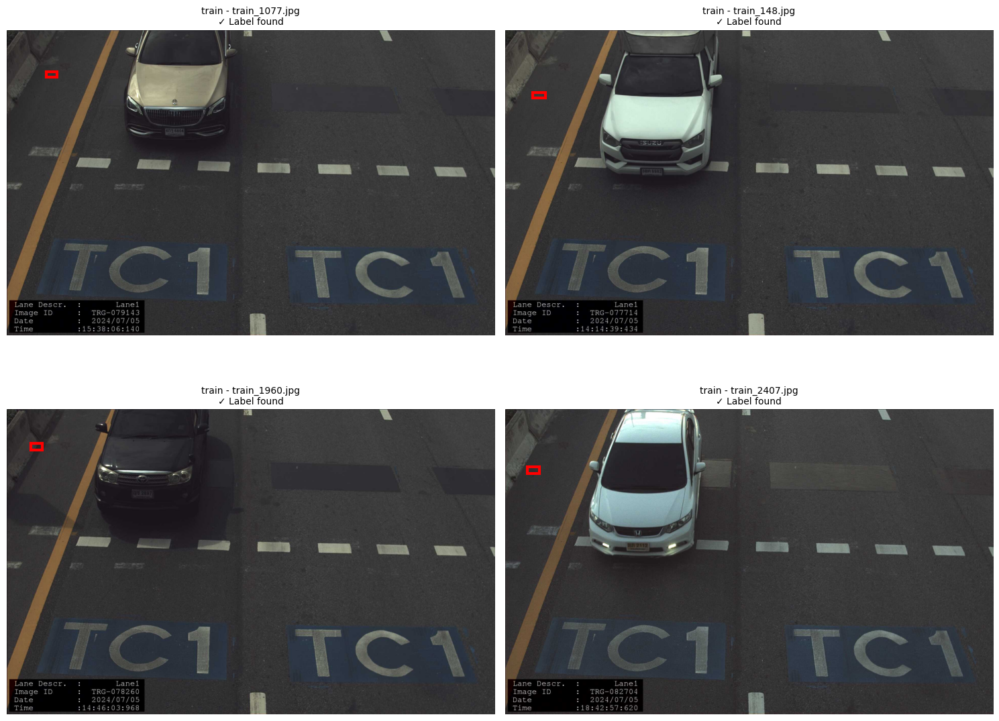

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def visualize_sample(split='train', num_samples=4):
    """Visualize samples from the dataset"""
    img_dir = OUTPUT_DIR / 'images' / split
    label_dir = OUTPUT_DIR / 'labels' / split
    
    img_files = list(img_dir.glob('*.jpg'))
    if not img_files:
        img_files = list(img_dir.glob('*.png'))
    
    if not img_files:
        print(f"No images found in {img_dir}")
        return
    
    num_samples = min(num_samples, len(img_files))
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()
    
    for i in range(num_samples):
        img_path = img_files[i]
        label_path = label_dir / f"{img_path.stem}.txt"
        
        # Load image
        img = cv2.imread(str(img_path))
        if img is None:
            print(f"Failed to load image: {img_path}")
            continue
            
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        
        # Display image
        axes[i].imshow(img)
        
        # Read and draw label if exists
        if label_path.exists():
            try:
                with open(label_path, 'r') as f:
                    label = f.readline().strip().split()
                    class_id, x_center, y_center, width, height = map(float, label)
                
                # Convert from YOLO to pixel coordinates
                x_center_px = x_center * w
                y_center_px = y_center * h
                width_px = width * w
                height_px = height * h
                
                x1 = x_center_px - width_px / 2
                y1 = y_center_px - height_px / 2
                
                # Draw bounding box
                rect = patches.Rectangle((x1, y1), width_px, height_px, 
                                        linewidth=3, edgecolor='red', facecolor='none')
                axes[i].add_patch(rect)
                axes[i].set_title(f'{split} - {img_path.name}\n✓ Label found', fontsize=10)
            except Exception as e:
                axes[i].set_title(f'{split} - {img_path.name}\n✗ Error: {e}', fontsize=10, color='red')
                print(f"Error reading label for {img_path.name}: {e}")
        else:
            axes[i].set_title(f'{split} - {img_path.name}\n✗ No label file', fontsize=10, color='orange')
            print(f"Label file not found: {label_path}")
        
        axes[i].axis('off')
    
    # Hide unused subplots
    for i in range(num_samples, 4):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

# Visualize training samples
print("Visualizing training samples...")
visualize_sample('train', num_samples=4)

## Debug: Visualize RAW data from CSV (before any conversion)



Sample 1:
  Image: 1920x1200px
  Car bbox: [26.0, 5.0, 1013.0, 1264.0]
  Plate bbox (raw from CSV): [331.0, 1149.0, 528.0, 1233.0]
  ⚠️ PLATE BBOX IS OUTSIDE IMAGE BOUNDS!

Sample 2:
  Image: 1920x1200px
  Car bbox: [0.0, 5.0, 944.0, 1466.0]
  Plate bbox (raw from CSV): [148.6, 1370.1, 354.5, 1470.6]
  ⚠️ PLATE BBOX IS OUTSIDE IMAGE BOUNDS!

Sample 3:
  Image: 1920x1200px
  Car bbox: [10.0, 5.0, 1178.0, 1600.0]
  Plate bbox (raw from CSV): [387.3, 1437.0, 593.4, 1540.7]
  ⚠️ PLATE BBOX IS OUTSIDE IMAGE BOUNDS!

Sample 4:
  Image: 1920x1200px
  Car bbox: [0.0, 0.0, 1024.0, 1205.0]
  Plate bbox (raw from CSV): [309.0, 1038.0, 482.0, 1113.0]
  ✓ Bbox is within image bounds

Sample 5:
  Image: 1920x1200px
  Car bbox: [136.4, 71.6, 1212.4, 1532.6]
  Plate bbox (raw from CSV): [362.7, 1357.2, 592.2, 1461.0]
  ⚠️ PLATE BBOX IS OUTSIDE IMAGE BOUNDS!

Sample 6:
  Image: 1920x1200px
  Car bbox: [0.9, 0.1, 906.4, 993.9]
  Plate bbox (raw from CSV): [292.9, 868.4, 484.0, 986.1]
  ✓ Bbox is within

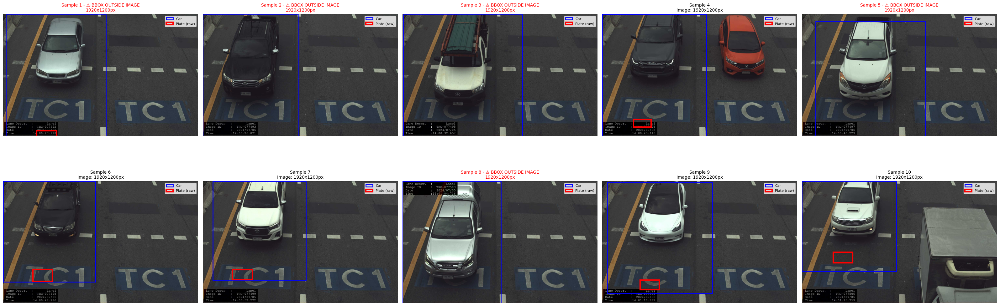


BLUE BOX = Car bbox (from car_bbox column)
RED BOX = Plate bbox (raw from plate_bbox column)

If red box is OUTSIDE the image:
  → plate_bbox coordinates are wrong in the CSV

If red box is TINY and near origin (0,0):
  → plate_bbox is relative to car crop, need to add car offset

If red box is on the license plate:
  → plate_bbox is already in full image coordinates!


In [ ]:
# Visualize RAW bounding boxes directly from CSV
# This shows the actual coordinates without any conversion

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

num_samples = 10  # Show 10 samples for debugging
fig, axes = plt.subplots(2, 5, figsize=(32, 12))
axes = axes.flatten()

for i in range(min(num_samples, len(df_valid))):
    row = df_valid.iloc[i]
    
    # Load image using cv2 (handles Unicode paths)
    img_path = Path(row['full_path'])
    
    if not img_path.exists():
        print(f"File not found: {img_path}")
        axes[i].text(0.5, 0.5, f'File not found:\n{img_path.name}', 
                    ha='center', va='center', fontsize=8)
        axes[i].axis('off')
        continue
    
    try:
        img = load_image_cv2(img_path)
        h, w = img.shape[:2]
        
        # Draw image
        axes[i].imshow(img)
        axes[i].set_title(f"Sample {i+1}\nImage: {w}x{h}px", fontsize=10)
        
        # Parse and draw car bbox (blue)
        car_bbox_str = row['car_bbox']
        car_bbox = parse_bbox(car_bbox_str)
        if car_bbox:
            cx1, cy1, cx2, cy2 = car_bbox
            car_rect = patches.Rectangle((cx1, cy1), cx2-cx1, cy2-cy1,
                                          linewidth=2, edgecolor='blue', facecolor='none',
                                          label='Car')
            axes[i].add_patch(car_rect)
            print(f"\nSample {i+1}:")
            print(f"  Image: {w}x{h}px")
            print(f"  Car bbox: [{cx1:.1f}, {cy1:.1f}, {cx2:.1f}, {cy2:.1f}]")
        
        # Parse and draw plate bbox AS-IS from CSV (red)
        plate_bbox_str = row['plate_bbox']
        plate_bbox = parse_bbox(plate_bbox_str)
        if plate_bbox:
            px1, py1, px2, py2 = plate_bbox
            plate_rect = patches.Rectangle((px1, py1), px2-px1, py2-py1,
                                            linewidth=3, edgecolor='red', facecolor='none',
                                            label='Plate (raw)')
            axes[i].add_patch(plate_rect)
            print(f"  Plate bbox (raw from CSV): [{px1:.1f}, {py1:.1f}, {px2:.1f}, {py2:.1f}]")
            
            # Check if outside bounds
            if px1 < 0 or py1 < 0 or px2 > w or py2 > h:
                print(f"  ⚠️ PLATE BBOX IS OUTSIDE IMAGE BOUNDS!")
                axes[i].set_title(f"Sample {i+1} - ⚠️ BBOX OUTSIDE IMAGE\n{w}x{h}px", 
                                fontsize=10, color='red')
            else:
                print(f"  ✓ Bbox is within image bounds")
        
        axes[i].axis('off')
        axes[i].legend(loc='upper right', fontsize=8)
        
    except Exception as e:
        print(f"Error loading {img_path.name}: {e}")
        axes[i].text(0.5, 0.5, f'Error:\n{str(e)}', ha='center', va='center', fontsize=8)
        axes[i].axis('off')

# Hide unused subplots
for i in range(min(num_samples, len(df_valid)), 10):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("BLUE BOX = Car bbox (from car_bbox column)")
print("RED BOX = Plate bbox (raw from plate_bbox column)")
print("")
print("If red box is OUTSIDE the image:")
print("  → plate_bbox coordinates are wrong in the CSV")
print("")
print("If red box is TINY and near origin (0,0):")
print("  → plate_bbox is relative to car crop, need to add car offset")
print("")
print("If red box is on the license plate:")
print("  → plate_bbox is already in full image coordinates!")
print("="*60)

In [10]:
# Now let's check what was actually written to the label files
print("Checking generated label files:\n")

# Check first 3 training samples
train_img_dir = OUTPUT_DIR / 'images' / 'train'
train_label_dir = OUTPUT_DIR / 'labels' / 'train'

label_files = list(train_label_dir.glob('*.txt'))[:3]

for label_path in label_files:
    img_path = train_img_dir / f"{label_path.stem}.jpg"
    
    print(f"Label file: {label_path.name}")
    
    # Read label
    with open(label_path, 'r') as f:
        content = f.read().strip()
        print(f"  Content: {content}")
    
    # Get image dimensions
    if img_path.exists():
        img = Image.open(img_path)
        w, h = img.size
        print(f"  Image size: {w} x {h}")
        
        # Parse and convert to pixels
        parts = content.split()
        if len(parts) == 5:
            cls, xc, yc, bw, bh = map(float, parts)
            x1 = (xc - bw/2) * w
            y1 = (yc - bh/2) * h
            x2 = (xc + bw/2) * w
            y2 = (yc + bh/2) * h
            print(f"  Pixel bbox: [{x1:.1f}, {y1:.1f}, {x2:.1f}, {y2:.1f}]")
            print(f"  Bbox size: {(x2-x1):.1f} x {(y2-y1):.1f} pixels")
    
    print()

Checking generated label files:



## Step 7: Train YOLOv11 Small Model


In [ ]:
from ultralytics import YOLO

# Load YOLOv11 small model (pretrained on COCO)
model = YOLO('yolo11s.pt')

print("YOLOv11 small model loaded")
print(f"Model type: {type(model)}")

In [ ]:
# Train the model
results = model.train(
    data=str(yaml_path),
    epochs=100,
    imgsz=640,
    batch=16,
    name='plate_detector',
    patience=20,  # Early stopping patience
    save=True,
    device=0,  # Use GPU 0, or 'cpu' for CPU training
    workers=4,
    pretrained=True,
    optimizer='AdamW',
    lr0=0.001,  # Initial learning rate
    lrf=0.01,   # Final learning rate (lr0 * lrf)
    momentum=0.937,
    weight_decay=0.0005,
    warmup_epochs=3,
    cos_lr=True,  # Cosine LR scheduler
    augment=True,
    project='runs/detect',
    exist_ok=True,
)

print("Training completed!")
print(f"Results saved to: {results.save_dir}")

## Step 8: Evaluate Model Performance


In [ ]:
# Validate on test set
# Load best model
best_model = YOLO('runs/detect/plate_detector/weights/best.pt')

# Run validation
metrics = best_model.val(data=str(yaml_path), split='test')

print("\nTest Set Metrics:")
print(f"mAP@50: {metrics.box.map50:.4f}")
print(f"mAP@50-95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}")

## Step 9: Test on Sample Images


In [ ]:
# Test on random images from test set
test_images = list((OUTPUT_DIR / 'images' / 'test').glob('*.jpg'))[:5]

# Run inference
for img_path in test_images:
    results = best_model(str(img_path), conf=0.25, iou=0.45)
    
    # Display results
    for r in results:
        # Plot results
        im_array = r.plot()  # BGR numpy array
        im = Image.fromarray(im_array[..., ::-1])  # Convert to RGB PIL image
        
        plt.figure(figsize=(12, 8))
        plt.imshow(im)
        plt.title(f"Detection: {img_path.name}")
        plt.axis('off')
        plt.show()
        
        # Print detections
        if len(r.boxes) > 0:
            print(f"\n{img_path.name}:")
            for box in r.boxes:
                conf = box.conf[0]
                cls = box.cls[0]
                print(f"  - Class: {int(cls)} (license_plate), Confidence: {conf:.3f}")

## Step 10: Export Model for Production

You can export the trained model to different formats for deployment:


In [ ]:
# Export to ONNX format (widely supported)
onnx_path = best_model.export(format='onnx')
print(f"ONNX model exported to: {onnx_path}")

# Optional: Export to TensorRT for faster inference (requires NVIDIA GPU)
# tensorrt_path = best_model.export(format='engine')
# print(f"TensorRT model exported to: {tensorrt_path}")

# Optional: Export to TFLite for mobile/edge devices
# tflite_path = best_model.export(format='tflite')
# print(f"TFLite model exported to: {tflite_path}")

## Summary and Next Steps

### Training Configuration

- **Model**: YOLOv11 Small (pretrained on COCO)
- **Dataset**: Thai license plates from data/8000
- **Training**: 100 epochs with early stopping (patience=20)
- **Image Size**: 640x640
- **Batch Size**: 16
- **Optimizer**: AdamW with cosine LR scheduler

### Model Location

The best model weights are saved at:
`runs/detect/plate_detector/weights/best.pt`

### Usage Example

```python
from ultralytics import YOLO

# Load trained model
model = YOLO('runs/detect/plate_detector/weights/best.pt')

# Run inference
results = model('path/to/image.jpg', conf=0.25)

# Process results
for r in results:
    boxes = r.boxes  # Bounding boxes
    for box in boxes:
        x1, y1, x2, y2 = box.xyxy[0]  # Box coordinates
        conf = box.conf[0]  # Confidence score
        print(f"Plate detected at ({x1}, {y1}, {x2}, {y2}) with confidence {conf:.3f}")
```

### Next Steps

1. Fine-tune hyperparameters if needed
2. Add more data augmentation for better generalization
3. Try larger models (yolo11m or yolo11l) for better accuracy
4. Integrate with OCR model for end-to-end plate recognition
5. Deploy using ONNX or TensorRT for production


## NEW DEBUG: Visualize ALL correction steps



Sample 1: 2024-07-05_14-00-23-928_TRG-077492_Lane1_กง8989-THA_83_CTX.jpg
Image size: 1920x1200

RAW from CSV:
  Car bbox (raw):   [26, 5, 1013, 1264]
  Plate bbox (raw): [331, 1149, 528, 1233]

After scale correction (÷4):
  Car bbox:   [6.5, 1.2, 253.2, 316.0]
  Plate bbox: [82.8, 287.2, 132.0, 308.2]

FINAL plate bbox (after adding car offset):
  [89.2, 288.5, 138.5, 309.5]
  Size: 49.2 x 21.0 px

Sample 2: 2024-07-05_14-00-26-071_TRG-077493_Lane1_5กณ2033-THA_10_CTX.jpg
Image size: 1920x1200

RAW from CSV:
  Car bbox (raw):   [0, 5, 944, 1466]
  Plate bbox (raw): [149, 1370, 354, 1471]

After scale correction (÷4):
  Car bbox:   [0.0, 1.2, 236.0, 366.5]
  Plate bbox: [37.2, 342.5, 88.6, 367.7]

FINAL plate bbox (after adding car offset):
  [37.2, 343.8, 88.6, 368.9]
  Size: 51.5 x 25.1 px

Sample 3: 2024-07-05_14-00-32-657_TRG-077495_Lane1_2ฒห6707-THA_10_CTX.jpg
Image size: 1920x1200

RAW from CSV:
  Car bbox (raw):   [10, 5, 1178, 1600]
  Plate bbox (raw): [387, 1437, 593, 1541]

A

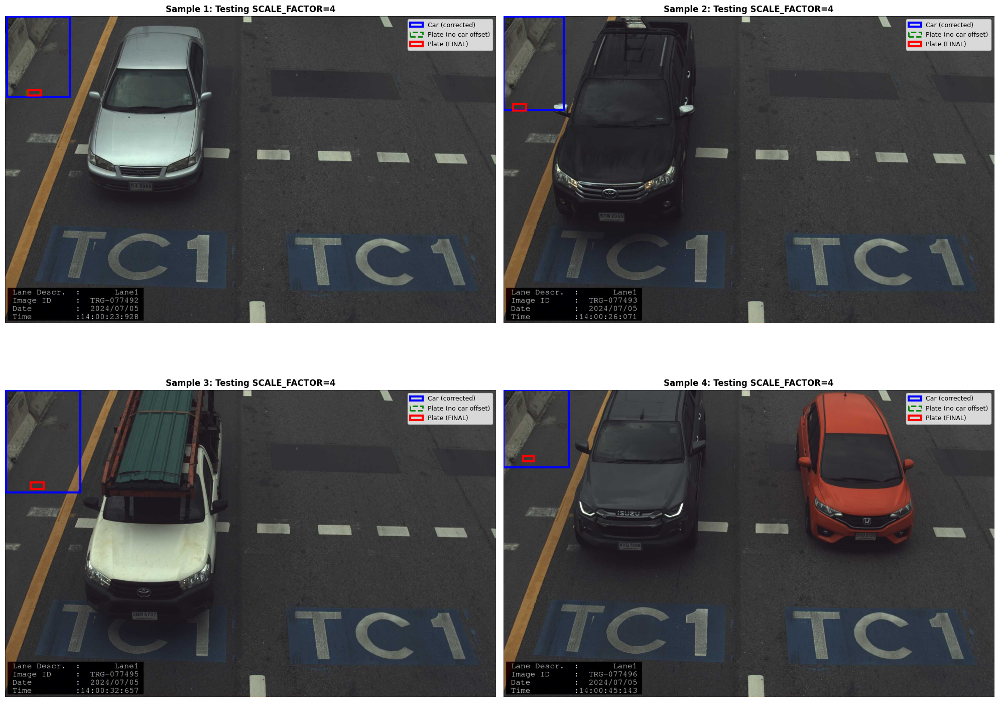


COLOR KEY:
  BLUE   = Car bbox (after scale correction)
  GREEN  = Plate bbox (scale corrected, NO car offset)
  RED    = Plate bbox FINAL (scale corrected + car offset)

If RED box is on the license plate → SCALE_FACTOR is correct!
If RED box is too small/large → adjust SCALE_FACTOR
If GREEN box looks correct → problem is with car_bbox coordinates


In [ ]:
# Debug: Show BOTH car_bbox and plate_bbox corrections step by step
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

# Test different scale factors
SCALE_FACTOR = 4  # Changed from 4.0 - trying smaller factor

num_samples = 4
fig, axes = plt.subplots(2, 2, figsize=(20, 16))
axes = axes.flatten()

for i in range(min(num_samples, len(df_valid))):
    row = df_valid.iloc[i]
    
    # Load image using cv2 (handles Unicode paths)
    img_path = Path(row['full_path'])
    if not img_path.exists():
        continue
    
    try:
        img = load_image_cv2(img_path)
        h, w = img.shape[:2]
        
        # Draw image
        axes[i].imshow(img)
        axes[i].set_title(f"Sample {i+1}: Testing SCALE_FACTOR={SCALE_FACTOR}", fontsize=12, weight='bold')
        
        # Get raw bboxes from CSV
        car_bbox_raw = row['car_bbox_parsed']
        plate_bbox_raw = row['plate_bbox_parsed']
        
        if car_bbox_raw and plate_bbox_raw:
            # Draw RAW car bbox (purple - will be outside image)
            cx1_raw, cy1_raw, cx2_raw, cy2_raw = car_bbox_raw
            
            # CORRECTED car bbox (divide by scale factor)
            cx1 = cx1_raw / SCALE_FACTOR
            cy1 = cy1_raw / SCALE_FACTOR
            cx2 = cx2_raw / SCALE_FACTOR
            cy2 = cy2_raw / SCALE_FACTOR
            
            # Draw corrected car bbox (blue)
            car_rect = patches.Rectangle((cx1, cy1), cx2-cx1, cy2-cy1,
                                          linewidth=3, edgecolor='blue', facecolor='none',
                                          label='Car (corrected)')
            axes[i].add_patch(car_rect)
            
            # CORRECTED plate bbox (divide by scale factor)
            px1_raw, py1_raw, px2_raw, py2_raw = plate_bbox_raw
            px1 = px1_raw / SCALE_FACTOR
            py1 = py1_raw / SCALE_FACTOR
            px2 = px2_raw / SCALE_FACTOR
            py2 = py2_raw / SCALE_FACTOR
            
            # Draw plate bbox WITHOUT car offset (green)
            plate_rect_no_offset = patches.Rectangle((px1, py1), px2-px1, py2-py1,
                                                      linewidth=2, edgecolor='green', facecolor='none',
                                                      linestyle='--',
                                                      label='Plate (no car offset)')
            axes[i].add_patch(plate_rect_no_offset)
            
            # Add car offset to plate bbox
            px1_final = px1 + cx1
            py1_final = py1 + cy1
            px2_final = px2 + cx1
            py2_final = py2 + cy1
            
            # Draw FINAL plate bbox with car offset (red)
            plate_rect_final = patches.Rectangle((px1_final, py1_final), px2_final-px1_final, py2_final-py1_final,
                                                 linewidth=3, edgecolor='red', facecolor='none',
                                                 label='Plate (FINAL)')
            axes[i].add_patch(plate_rect_final)
            
            # Print debug info
            print(f"\n{'='*60}")
            print(f"Sample {i+1}: {img_path.name}")
            print(f"Image size: {w}x{h}")
            print(f"\nRAW from CSV:")
            print(f"  Car bbox (raw):   [{cx1_raw:.0f}, {cy1_raw:.0f}, {cx2_raw:.0f}, {cy2_raw:.0f}]")
            print(f"  Plate bbox (raw): [{px1_raw:.0f}, {py1_raw:.0f}, {px2_raw:.0f}, {py2_raw:.0f}]")
            print(f"\nAfter scale correction (÷{SCALE_FACTOR}):")
            print(f"  Car bbox:   [{cx1:.1f}, {cy1:.1f}, {cx2:.1f}, {cy2:.1f}]")
            print(f"  Plate bbox: [{px1:.1f}, {py1:.1f}, {px2:.1f}, {py2:.1f}]")
            print(f"\nFINAL plate bbox (after adding car offset):")
            print(f"  [{px1_final:.1f}, {py1_final:.1f}, {px2_final:.1f}, {py2_final:.1f}]")
            print(f"  Size: {(px2_final-px1_final):.1f} x {(py2_final-py1_final):.1f} px")
        
        axes[i].axis('off')
        axes[i].legend(loc='upper right', fontsize=9)
        
    except Exception as e:
        print(f"Error loading {img_path.name}: {e}")
        axes[i].text(0.5, 0.5, f'Error: {str(e)}', ha='center', va='center')
        axes[i].axis('off')

plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("COLOR KEY:")
print("  BLUE   = Car bbox (after scale correction)")
print("  GREEN  = Plate bbox (scale corrected, NO car offset)")
print("  RED    = Plate bbox FINAL (scale corrected + car offset)")
print("\nIf RED box is on the license plate → SCALE_FACTOR is correct!")
print("If RED box is too small/large → adjust SCALE_FACTOR")
print("If GREEN box looks correct → problem is with car_bbox coordinates")
print("="*70)

## CRITICAL DEBUG: Find the actual scale factor


Testing if CSV coordinates are already correct (NO scale correction)


Sample 1: 2024-07-05_14-00-23-928_TRG-077492_Lane1_กง8989-THA_83_CTX.jpg
  Image: 1920x1200
  Car bbox (raw):   [26.0, 5.0, 1013.0, 1264.0]
  Plate bbox (raw): [331.0, 1149.0, 528.0, 1233.0]
  Plate (full-img): [357.0, 1154.0, 554.0, 1238.0]
  ⚠️ OUTSIDE IMAGE BOUNDS - coordinates need scaling!

Sample 2: 2024-07-05_14-00-26-071_TRG-077493_Lane1_5กณ2033-THA_10_CTX.jpg
  Image: 1920x1200
  Car bbox (raw):   [0.0, 5.0, 944.0, 1466.0]
  Plate bbox (raw): [148.6, 1370.1, 354.5, 1470.6]
  Plate (full-img): [148.6, 1375.1, 354.5, 1475.6]
  ⚠️ OUTSIDE IMAGE BOUNDS - coordinates need scaling!

Sample 3: 2024-07-05_14-00-32-657_TRG-077495_Lane1_2ฒห6707-THA_10_CTX.jpg
  Image: 1920x1200
  Car bbox (raw):   [10.0, 5.0, 1178.0, 1600.0]
  Plate bbox (raw): [387.3, 1437.0, 593.4, 1540.7]
  Plate (full-img): [397.3, 1442.0, 603.4, 1545.7]
  ⚠️ OUTSIDE IMAGE BOUNDS - coordinates need scaling!

Sample 4: 2024-07-05_14-00-45-143_TRG-

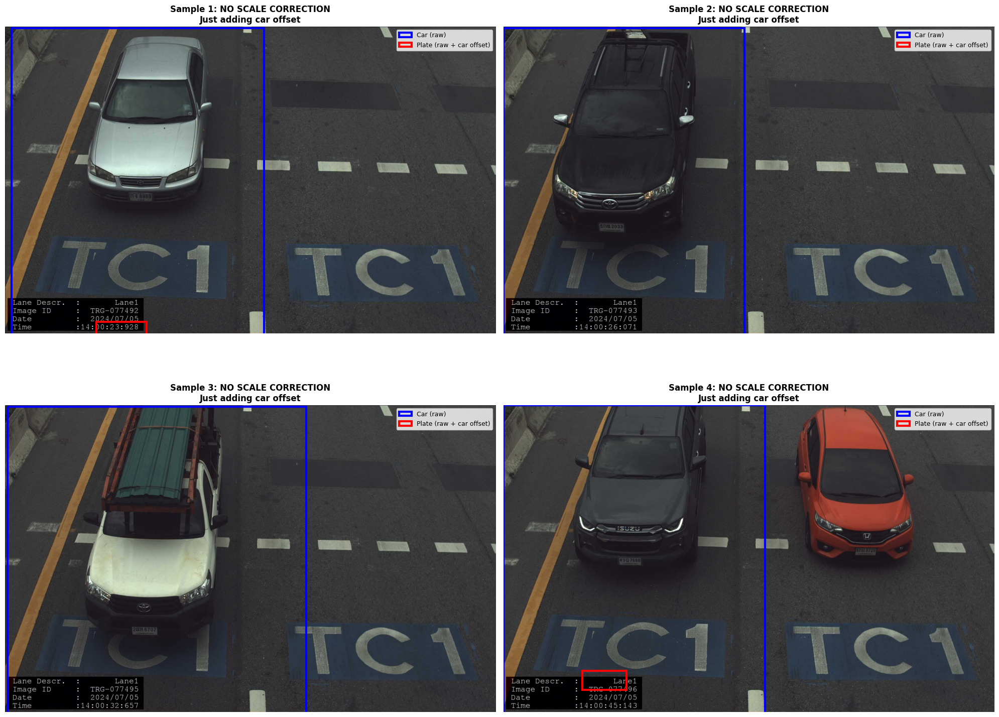


TESTING: Are the CSV coordinates already correct?
If RED box is on the license plate → NO scale correction needed!
If boxes are outside image → coordinates ARE upscaled, need correction


In [ ]:
# Let's check if the coordinates in CSV are ALREADY correct (no scaling bug)
# by visualizing them directly WITHOUT any correction

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

print("Testing if CSV coordinates are already correct (NO scale correction)\n")

num_samples = 4
fig, axes = plt.subplots(2, 2, figsize=(20, 16))
axes = axes.flatten()

for i in range(min(num_samples, len(df_valid))):
    row = df_valid.iloc[i]
    
    # Load image using cv2 (handles Unicode paths)
    img_path = Path(row['full_path'])
    if not img_path.exists():
        continue
    
    try:
        img = load_image_cv2(img_path)
        h, w = img.shape[:2]
        
        # Draw image
        axes[i].imshow(img)
        
        # Get raw bboxes from CSV
        car_bbox_raw = row['car_bbox_parsed']
        plate_bbox_raw = row['plate_bbox_parsed']
        
        if car_bbox_raw and plate_bbox_raw:
            # Use car_bbox AS-IS (no correction)
            cx1, cy1, cx2, cy2 = car_bbox_raw
            
            # Use plate_bbox AS-IS, but add car offset (it's car-relative)
            px1, py1, px2, py2 = plate_bbox_raw
            
            # Convert plate from car-relative to full-image
            px1_full = px1 + cx1
            py1_full = py1 + cy1
            px2_full = px2 + cx1
            py2_full = py2 + cy1
            
            # Draw car bbox (blue)
            car_rect = patches.Rectangle((cx1, cy1), cx2-cx1, cy2-cy1,
                                          linewidth=3, edgecolor='blue', facecolor='none',
                                          label='Car (raw)')
            axes[i].add_patch(car_rect)
            
            # Draw plate bbox (red)
            plate_rect = patches.Rectangle((px1_full, py1_full), px2_full-px1_full, py2_full-py1_full,
                                           linewidth=3, edgecolor='red', facecolor='none',
                                           label='Plate (raw + car offset)')
            axes[i].add_patch(plate_rect)
            
            axes[i].set_title(f"Sample {i+1}: NO SCALE CORRECTION\nJust adding car offset", fontsize=12, weight='bold')
            
            # Print coords
            print(f"\nSample {i+1}: {img_path.name}")
            print(f"  Image: {w}x{h}")
            print(f"  Car bbox (raw):   [{cx1:.1f}, {cy1:.1f}, {cx2:.1f}, {cy2:.1f}]")
            print(f"  Plate bbox (raw): [{px1:.1f}, {py1:.1f}, {px2:.1f}, {py2:.1f}]")
            print(f"  Plate (full-img): [{px1_full:.1f}, {py1_full:.1f}, {px2_full:.1f}, {py2_full:.1f}]")
            
            # Check if outside bounds
            if px1_full < 0 or py1_full < 0 or px2_full > w or py2_full > h:
                print(f"  ⚠️ OUTSIDE IMAGE BOUNDS - coordinates need scaling!")
            elif (cx2-cx1) > w or (cy2-cy1) > h:
                print(f"  ⚠️ CAR BBOX TOO LARGE - coordinates need descaling!")
            else:
                print(f"  ✓ Coordinates look reasonable")
        
        axes[i].axis('off')
        axes[i].legend(loc='upper right', fontsize=9)
        
    except Exception as e:
        print(f"Error loading {img_path.name}: {e}")
        axes[i].text(0.5, 0.5, f'Error: {str(e)}', ha='center', va='center')
        axes[i].axis('off')

plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("TESTING: Are the CSV coordinates already correct?")
print("If RED box is on the license plate → NO scale correction needed!")
print("If boxes are outside image → coordinates ARE upscaled, need correction")
print("="*70)